## 0 Initialising

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pickle
import os
import sys
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from matplotlib.colors import ListedColormap
from sklearn.metrics import f1_score

In [2]:
# Load data gathered in the previous notebook.
with open('output/CA_data.pkl', 'rb') as f:
    data = pickle.load(f)
print(data.keys())
print(data['coords'].keys())

dict_keys(['CRS', 'coords', 'NDVI', 'NDWI', 'slope', 'times', 'temperatue', 'wind_u', 'wind_v', 'burnt_area', 'ignition_points'])
dict_keys(['min_lat', 'max_lat', 'min_lon', 'max_lon', 'resolution', 'x_grid', 'y_grid'])


In [3]:
# Get the data and check the shape
NDVI = data['NDVI']
NDWI = data['NDWI']
slope = data['slope']
wind_u = data['wind_u']
wind_v = data['wind_v']
burnt_area = data['burnt_area']
ignition_points = data['ignition_points'][0] # we are only taking the first ignition point for simplicity

# checking the shape of the data, ensuring they are all the same size
print(NDVI.shape, NDWI.shape, slope.shape, wind_u.shape, wind_v.shape, burnt_area.shape, ignition_points.shape)

(286, 190) (286, 190) (286, 190) (312,) (312,) (286, 190) (2,)


In [4]:
ignition_point_lon, ingition_point_lat = ignition_points[0], ignition_points[1]

In [5]:
# Project the ignition points to the grid
# Need to implement this. Right now, I just hardcode it. It should be easy to create the function for this
FP_lon_index = 144
FP_lat_index = 118

In [6]:
# load in the grid - note that I messed up what is x and y when generating the data.
y = data['coords']['x_grid']
x = data['coords']['y_grid']
print(x.shape, y.shape)

(286,) (190,)


### Wind

The wind needs a bit of extra work before we can use it in the simulation

We currently have it only in U and V direction so east and north direction. We are turning it into a matrix by calculating the components in N, NE, E, S, S-W, W, N-W. The additional diagonal directions are calculate by (U+V)/SQRT(2). We just need to make sure that the we put the correct signs for each direction, e.g., NW = (-U+V)/SQRT(2)

In [7]:
# U goes west to east, V goes south to north
# we have the wind given in u and v direct. We need to convert it to the N, NE, E, S, S-W, W, N-W
# 0,0 0,1 0,2   NW, N, NE
# 1,0 1,1 1,2    W, 0, E
# 2,0 2,1 2,2   SW, S, SE
wind_matrix = np.zeros((wind_u.shape[0], 3, 3))
for t in range(wind_u.shape[0]):
    wind_matrix[t, 0, 0] = (wind_v[t] - wind_u[t]) / np.sqrt(2)
    wind_matrix[t, 0, 1] = wind_v[t]
    wind_matrix[t, 0, 2] = (wind_v[t] + wind_u[t]) / np.sqrt(2)
    wind_matrix[t, 1, 0] = -wind_u[t]
    wind_matrix[t, 1, 1] = 0
    wind_matrix[t, 1, 2] = wind_u[t]    
    wind_matrix[t, 2, 0] = (-wind_v[t] - wind_u[t]) / np.sqrt(2)
    wind_matrix[t, 2, 1] = -wind_v[t] 
    wind_matrix[t, 2, 2] = (-wind_v[t] + wind_u[t]) / np.sqrt(2)

# normalize the wind matrix to be between -1 and 1
wind_u = wind_u / np.abs(np.max(wind_matrix))
wind_v = wind_v / np.abs(np.max(wind_matrix))
wind_matrix = wind_matrix / np.abs(np.max(wind_matrix))
    

# 1 The Simulation 

The game plan is to build our cellular automaton simulation step by step. 

1) At first, we will initialise the fire_state matrix and make sure it runs.
2) We include the NDVI and add nonflammable cells
3) Then, we add the slope and wind, they are a bit tricky because they require directional information
4) Finally, we use OPTUNA to optimise the parameters of our simulation.

## 1.1 Setting up the Cellular Automaton

In the first step, we create the fire_state array. It will show
* 0 for burnable cells
* 1 for burning cells
* 2 for burnt cells

The logic is quite simple:
* Burning cells can set fire to all adjacent cells including diagonal cells. 
* If there are 2 or burning cells adjacent to a burnable cell, the burn probability increases. 
* Burning cells turn into burnt cells after 1 time step. Burnt cells remain burnt.

In this first step, we will have a lot of FOR loops which makes it run a bit slow, but the logic of how the code works is very clear. We do a quick 40 time steps which will take less than 1min. (If we vectorise the code it should run in less than 1s.)


In [8]:
# Let's start by initialising the fire state and some more parameters
n_t = 40
# fire_state = lon x lat
fire_state = np.zeros((n_t, len(x), len(y)), dtype=int)

#p_burn = p_h # probability of burning
p_h = 0.6
p_burn = p_h

# initialise fire state
fire_state[0, FP_lon_index, FP_lat_index] = 1

for i_t in range(1,n_t):
    for i in range(len(x)):
        for j in range(len(y)):
            # If cell is burnt it remains burnt
            if fire_state[i_t-1, i, j] == 2:
                fire_state[i_t, i, j] = 2
            # If cell was burning it turns into a burnt cell
            elif fire_state[i_t-1, i, j] == 1:
                fire_state[i_t, i, j] = 2
            # If cell is not burning and adjacent cell is burning, calculate if it turns to burning cell
            # First, we check if any of the neighbouring cells is burning
            elif (i+1 < len(x) and fire_state[i_t-1, i+1, j] == 1) or \
               (i-1 >= 0 and fire_state[i_t-1, i-1, j] == 1) or \
               (j+1 < len(y) and fire_state[i_t-1, i, j+1] == 1) or \
               (j-1 >= 0 and fire_state[i_t-1, i, j-1] == 1) or \
               (i+1 < len(x) and j+1 < len(y) and fire_state[i_t-1, i+1, j+1] == 1) or \
               (i-1 >= 0 and j-1 >= 0 and fire_state[i_t-1, i-1, j-1] == 1) or \
               (i+1 < len(x) and j-1 >= 0 and fire_state[i_t-1, i+1, j-1] == 1) or \
               (i-1 >= 0 and j+1 < len(y) and fire_state[i_t-1, i-1, j+1] == 1):
                if np.random.rand() < p_burn:
                    fire_state[i_t, i, j] = 1
                else:
                    fire_state[i_t, i, j] = 0
            # All cells that are not burning and not adjacent to a burning cell remain in the same state (burnt->burnt, flammable->flammable)
            else:
                fire_state[i_t, i, j] = fire_state[i_t-1, i, j]

Let's start to set up the animation for the results. We will improve the looks of the animation as we introduce more information to the simulation.

In [9]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from matplotlib.colors import ListedColormap

#fire_state = np.transpose(fire_state, (0, 2, 1))
fig, ax = plt.subplots()
cmap_123 = ListedColormap(['green', 'black', 'red'])
im = ax.imshow(fire_state[0, :, :], cmap=cmap_123,vmax=2, vmin=0)

def update(t):
    im.set_array(fire_state[t, :, :])
    ax.set_title(f"Time Step: {t}")
    return [im]

fig.set_size_inches(4, 6)  # Adjust the figure size to your preference
plt.tight_layout()         # Minimizes white space
ani = FuncAnimation(fig, update, frames=range(0, n_t,2), interval=200, blit=True)
plt.close(fig)  # Prevents duplicate static plot display

HTML(ani.to_jshtml())

With all the FOR loops, the code is running already slow at this stage, but we will fix it later on. So far the results look good. The fire spreads. We also set up the code for the animation. In the next section, we will improve the visuals of the animation by adding in the water and some features on land as well.

## 1.2 Adding the NDVI

In this section, we will include the NDVI into the simulation. This feature is easier compared to the slope and wind direction because for NDVI, we do not need to worry about the direction of the fire spread, and, it is static. No time dependence.

We will also use the NDVI to classify water and unflammable cells. It would have been better to use the SLC band from Sentinel to classify these areas, but the NDVI shall be enough for our purposes.

Let's visualise the NDVI first.

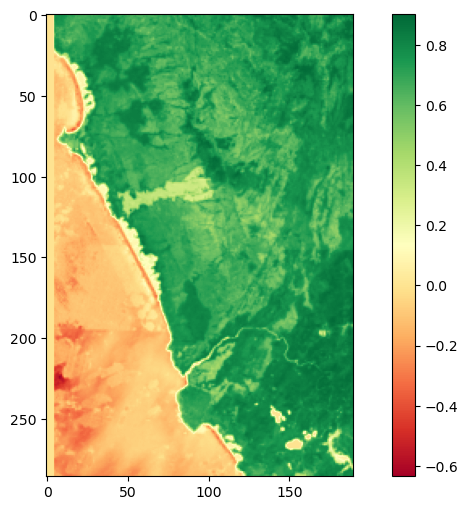

In [10]:
plt.figure(figsize=(10, 6))
plt.imshow(NDVI[:,:], cmap='RdYlGn')
plt.colorbar()
plt.show()

Ok we see water and ocean in red yellow-ish. The sideways cactus around the centre of the image is unvegetated area, probably from a previous wildfire. This are should be nonflammable. Similarly, the beach area should be nonflammable.

Let's group the NDVI values

In [11]:
fire_state = np.zeros([n_t, len(x), len(y)], dtype=int)

We create 5 layers using the NDVI:
* Water where NDVI<0.2
* nonflammable where NDVI<0.5
* normal vegetation where NDVI<0.7
* dense vegetatation where NDVI>0.7

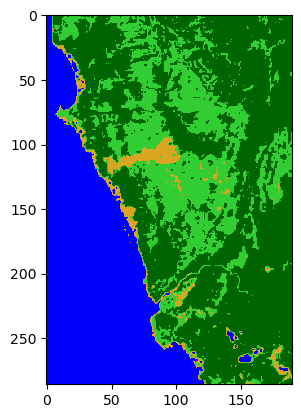

In [12]:
ndvi= NDVI
water_thres = 0.1
low_thres = 0.4
high_thres = 0.75

def calculate_p_den(water_thres, low_thres, high_thres, NDVI):
    water_value = 'water'
    low_value = 'nonflammable'
    mid_value = 'medium'
    high_value = 'dense'

    ndvi_grouped = np.where(NDVI < water_thres, water_value, NDVI)
    ndvi_grouped = np.where((NDVI >= water_thres) & (NDVI < low_thres), low_value, ndvi_grouped)
    ndvi_grouped = np.where((NDVI >= low_thres) & (NDVI < high_thres), mid_value, ndvi_grouped)
    ndvi_grouped = np.where(NDVI >= high_thres, high_value, ndvi_grouped)

    return ndvi_grouped

def calculate_p_den_values(den_water, den_low, den_mid, den_high, ndvi_grouped):
    p_den = ndvi_grouped.copy()
    p_den = np.where(p_den == 'water', den_water, p_den)
    p_den = np.where(p_den == 'nonflammable', den_low, p_den)
    p_den = np.where(p_den == 'medium', den_mid, p_den)
    p_den = np.where(p_den == 'dense', den_high, p_den)
    p_den = p_den.astype(float)
    return p_den

ndvi_cmap = ListedColormap(['blue', 'goldenrod', 'limegreen', 'darkgreen'])  # Green for NDVI, Red for fire_state 1 and 2

ndvi= NDVI
water_thres = 0.1
low_thres = 0.5
high_thres = 0.7

den_water = -1 # Using negative values for water to ensure it can't be enflamed
den_low = -1 # These are nonflammable areas
den_mid = 0 # These are the general areas 
den_high = 0.2 # Dense areas have increased change of spreading

# Let's group the NDVI using the first function
ndvi_grouped = calculate_p_den(water_thres, low_thres, high_thres, ndvi)

# ndvi_water will be used to for visualisation, all sections are given my intergers making the colormap easier to apply
ndvi_water = calculate_p_den_values(-1, 0, 1, 2, ndvi_grouped)

# p_den is the one that will actually be used for calculation. Not that water and nonflammable are both -1, i.e., nonflammable.

# Otherwise, the more vegetation the higher the burn probability
p_den = calculate_p_den_values(den_water, den_low, den_mid, den_high, ndvi_grouped)

cmap_123 = ListedColormap(['blue', 'goldenrod', 'limegreen', 'darkgreen'])
plt.imshow(ndvi_water, cmap=cmap_123)
plt.show()
#plt.imshow(burnt_area, cmap='Reds', alpha=0.5)

Looking good. We have the ocean in blue and the beach in brown is nonflammable. Then we vegetation in a lighter green and dense vegetation in a darker green

The simulation is updated in a simple manner. We only need to change p_burn. And change p_burn to p_burn[i,j] a bit further down the code.

In [13]:
# Let's start by initialising the fire state and some more parameters
n_t = 80
# fire_state = lon x lat
fire_state = np.zeros((n_t, len(x), len(y)), dtype=int)

#p_burn = p_h * (1+p_den) # probability of burning
p_h = 0.6
p_burn = p_h*(1+p_den)

# initialise fire state
fire_state[0, FP_lon_index, FP_lat_index] = 1

for i_t in range(1,n_t):
    for i in range(len(x)):
        for j in range(len(y)):
            # If cell is burnt it remains burnt
            if fire_state[i_t-1, i, j] == 2:
                fire_state[i_t, i, j] = 2
            # If cell was burning it turns into a burnt cell
            elif fire_state[i_t-1, i, j] == 1:
                fire_state[i_t, i, j] = 2
            # If cell is not burning and adjacent cell is burning, calculate if it turns to burning cell
            elif (i+1 < len(x) and fire_state[i_t-1, i+1, j] == 1) or \
               (i-1 >= 0 and fire_state[i_t-1, i-1, j] == 1) or \
               (j+1 < len(y) and fire_state[i_t-1, i, j+1] == 1) or \
               (j-1 >= 0 and fire_state[i_t-1, i, j-1] == 1) or \
               (i+1 < len(x) and j+1 < len(y) and fire_state[i_t-1, i+1, j+1] == 1) or \
               (i-1 >= 0 and j-1 >= 0 and fire_state[i_t-1, i-1, j-1] == 1) or \
               (i+1 < len(x) and j-1 >= 0 and fire_state[i_t-1, i+1, j-1] == 1) or \
               (i-1 >= 0 and j+1 < len(y) and fire_state[i_t-1, i-1, j+1] == 1):
                if np.random.rand() < p_burn[i,j]:
                    fire_state[i_t, i, j] = 1
                else:
                    fire_state[i_t, i, j] = 0
            # All cells that are not burning and not adjacent to a burning cell remain unburnt
            else:
                fire_state[i_t, i, j] = fire_state[i_t-1, i, j]

In [14]:
# new cmap only has red and black
fire_cmap = ListedColormap(['red', 'black'])  
# Only show the burning and burnt states, unburnt states will be empty
fire_state = np.where(fire_state == 0, np.nan, fire_state)

fig, ax = plt.subplots()
# Plot the NDVI as the base layer
ndvi_plot = ax.imshow(ndvi_water, cmap=ndvi_cmap)  # NDVI as the base layer
# The fire state will now be an overlay
fire_plot = ax.imshow(fire_state[0], cmap=fire_cmap, vmin=1, vmax=2)

def update(frame):
    fire_plot.set_array(fire_state[frame])  # Update fire_state for the current frame
    ax.set_title(f"Time Step: {frame}")
    return [fire_plot]

fig.set_size_inches(4, 6)  # Adjust the figure size to your preference
plt.tight_layout()         # Minimizes white space
ani = FuncAnimation(fig, update, frames=range(0, n_t,2), interval=200, blit=True)
plt.close(fig)  # Prevents duplicate static plot display

HTML(ani.to_jshtml())

Okay, we are making progress. The fire is now not spreading into the ocean or unflammable cells (orange).

The burn probability is still a bit high, so unless the neighbouring cell is nonflammable, the fire will spread, but we will take care of this after including the slope and wind.

Let's do a quick spoiler of what the optimised code will look like because once we add the wind and slope, it will be more difficult to understand what is going on.
* We get rid of the FOR loops over the spatial directions (x,y)
* We will only calculate the fire spread for cells that are adjacent to burning cells, because these are the only ones that can catch fire
The trick is to build several masks of:
* The burning cells
* The cells adjacent to burning cells
* burnt cells
And then we act on all of the masks with operators in a vectorised way, i.e., no FOR loops, but instead we call the whole array at once to release the full power of the optmised numpy functions.

In [15]:
p_h = 0.6
p_burn = p_h * (1 + p_den)

# Initialise fire state
fire_state[0, FP_lon_index, FP_lat_index] = 1

for i_t in range(1, n_t):
    # Create a mask for cells that are burning in the previous time step
    burning_mask = fire_state[i_t - 1] == 1

    # Create a mask for cells that are finished burning
    finished_burning_mask = fire_state[i_t - 1] == 2

    # Create a mask for neighboring cells of burning cells, i.e., find out all the cells that are adjacent to burning cells
    neighbors_mask = (
        np.roll(burning_mask, shift=1, axis=0) |  # Up
        np.roll(burning_mask, shift=-1, axis=0) |  # Down
        np.roll(burning_mask, shift=1, axis=1) |  # Left
        np.roll(burning_mask, shift=-1, axis=1) |  # Right
        np.roll(np.roll(burning_mask, shift=1, axis=0), shift=1, axis=1) |  # Top-left
        np.roll(np.roll(burning_mask, shift=1, axis=0), shift=-1, axis=1) |  # Top-right
        np.roll(np.roll(burning_mask, shift=-1, axis=0), shift=1, axis=1) |  # Bottom-left
        np.roll(np.roll(burning_mask, shift=-1, axis=0), shift=-1, axis=1)  # Bottom-right
    )

    # Calculate the probability of burning for each cell
    random_values = np.random.rand(*fire_state[i_t].shape)
    burn_probability_mask = (random_values < p_burn) & neighbors_mask

    ## Update fire state
    # Everything that was previously burnt remains burnt
    fire_state[i_t][finished_burning_mask] = 2  
    # Everything that burning in the previous time step becomes burnt
    fire_state[i_t][burning_mask] = 2
    # Cells that were set on fire and that are not burning and not already burnt will catch fire.
    fire_state[i_t][burn_probability_mask & ~burning_mask & ~finished_burning_mask] = 1  
    # Everyhing else will keep the same state as before
    fire_state[i_t][~burn_probability_mask & ~burning_mask & ~finished_burning_mask] = fire_state[i_t - 1][
        ~burn_probability_mask & ~burning_mask & ~finished_burning_mask    ]

The power of vectorisation. The calculation runs now a whooping 200 times faster.

But don't celebrate too early, in the next section, we will need to think really hard to make this approach also work for the wind and slope.

* Looks better, we are not burning the nonflammable patches nor the water.
* We need to take care of the boundary conditions tho. The fire comes sweeping in from the top.
* We also still have no way to stop the fire, but let's integrate the wind and slope first

## 1.3 Wind and Slope

As foreshadowed, wind and slope will be more complicated because of their directional dependence. 

Let's take the slope for example. In one direction, the slope is uphill while in the other direction it will be downhill. To deal account for this directional dependence, we need to track the relation of the burning cell to the to-be-burnt cell. There are 8 directions, right left, up, down + the 4 diagonals.

The way we are dealing with this is that for each cell, we will have 8 slope values for each direction. So, we have the change in slope for each adjacent sell stored in the slope.

Let's first define the neighbours

In [16]:
# Define relative neighbor positions for 8 directions
neighbor_offsets = [
    (1, 0),  # Down
    (-1, 0),  # Up
    (0, 1),  # Right
    (0, -1),  # Left
    (1, 1),  # Bottom-right
    (-1, -1),  # Top-left
    (1, -1),  # Bottom-left
    (-1, 1)  # Top-right
]

Next, we will define the simulation as a function.
* We initialise all the arrays and calculate p_den for the given set of parameters
* We calculate the slope for each direction and store it in elevation_diff
* We do not need to do this for the wind, as we already did it
* The simulation will only loop over the time and the 8 neighbour positions
    * Inside the time loop, we will create the mask for the fire, neighbours,
    * We continue with the calculation for for each of the 8 neighbours
        * Retrieve slope and wind for each of the 8 neighbours
        * Update the burn probability taking into account multiple neighbours
    * Update the fire_state as before (burning->burnt, burnt->burnt, flammable->burning, ...)

In [17]:
def run_simulation(n_t,den_water, den_low, den_mid, den_high, ndvi_grouped, c_w, c_s, slope, wind_matrix, FP_lat_index, FP_lon_index):
    p_den = calculate_p_den_values(den_water, den_low, den_mid, den_high, ndvi_grouped)
    # Initialize fire state
    fire_state = np.zeros([n_t, len(x), len(y) ], dtype=int)
    fire_state[0, FP_lon_index, FP_lat_index] = 1

    # Precompute elevation differences and wind effects
    elevation_diff = np.zeros((len(x), len(y), len(neighbor_offsets)))
    wind_effects = np.zeros((n_t, len(x), len(y), len(neighbor_offsets)))

    for idx, (dx, dy) in enumerate(neighbor_offsets):
        shifted_elevation = np.roll(np.roll(slope, shift=dx, axis=0), shift=dy, axis=1)
        elevation_diff[:, :, idx] = (slope - shifted_elevation) / np.max(np.abs(slope))
        #wind_effects[:, :, :, idx] = wind_matrix[:, dx + 1, dy + 1]

    # Main simulation loop
    for i_t in range(1, n_t):
        # Identify burning cells
        burning_mask = fire_state[i_t - 1] == 1

        # Create a mask for neighboring cells
        neighbors_mask = np.zeros_like(burning_mask, dtype=bool)
        for dx, dy in neighbor_offsets:
            neighbors_mask |= np.roll(np.roll(burning_mask, shift=dx, axis=0), shift=dy, axis=1)

        # Limit calculations to neighboring cells
        candidate_cells = np.where(neighbors_mask)

        # Calculate p_burn for candidate cells
        p_burn = np.zeros_like(fire_state[i_t], dtype=float)
        for idx, (dx, dy) in enumerate(neighbor_offsets):
            shifted_burning = np.roll(np.roll(burning_mask, shift=dx, axis=0), shift=dy, axis=1)
            p_cell = (
                (p_den[candidate_cells])
                * np.exp(c_s * elevation_diff[candidate_cells[0], candidate_cells[1], idx])
                * np.exp(c_w * wind_matrix[i_t, dx+1, dy+1])
            )
            p_burn[candidate_cells] = 1 - ((1 - p_burn[candidate_cells]) * (1 - p_cell))

        # Update fire state
        unaffected_mask = ~burning_mask & ~neighbors_mask
        fire_state[i_t] = fire_state[i_t - 1]
        random_values = np.random.rand(*fire_state[i_t].shape)
        fire_state[i_t][burning_mask] = 2  # Burning cells become burnt
        fire_state[i_t][(random_values < p_burn) & neighbors_mask & ~burning_mask] = 1
        fire_state[i_t] = np.where(fire_state[i_t-1]== 2, 2, fire_state[i_t])
    return fire_state

The wind component comes with an additional component that we need to consider - time. All other components did not include a time component. The time component makes everything a bit more complicated.

We would need to ensure that we have the correct spreading speed such that fire reaches the end of the burn scare in the same time as the fire reaches it in reality. Assuming that the fire always spreads, the speed of the spread is given by size_of_cell/time_step. The wind data is given in hours, so this would be our time step. We would now need to adjust the size of the cell, i.e., our resultion to match the actual speed of the fire. This means, we would need to rerun our previous script to get the required resolution.

Let's worry about this later and give the simulation a go. We initialise the parameters for the simulation, run it and visualise it.
Note that we have defined the simulation such that we can change the values of the NDVI parameters.

In [18]:
water_thres = 0.1
low_thres = 0.4
mid_thres = 0.65
high_thres = 0.75

den_water = 0 # Using negative values for water to ensure it can't be enflamed
den_low = 0 # These are nonflammable areas
den_mid = 0.25 # These are the general areas 
den_high = 0.1 # quite dense areas, good chance for fire to spread

ndvi_grouped = calculate_p_den(water_thres, low_thres, high_thres, ndvi)


c_w = 5 # We use a very high value here, so it is easy to see the effect of wind in the simulation
c_s = 2
n_t = 100

fire_state = run_simulation(n_t, den_water, den_low, den_mid, den_high, ndvi_grouped, c_w, c_s, slope, wind_matrix, FP_lat_index, FP_lon_index)

In [19]:
# Create a custom colormap for fire_state
fire_cmap = ListedColormap(['red', 'black'])  # Green for NDVI, Red for fire_state 1 and 2
ndvi_cmap = ListedColormap(['blue', 'goldenrod', 'limegreen', 'darkgreen'])  # Green for NDVI, Red for fire_state 1 and 2

fig, ax = plt.subplots()
fire_state = np.where(fire_state==0,np.nan,fire_state)
ndvi_plot = ax.imshow(ndvi_water, cmap=ndvi_cmap)  # NDVI as the base layer
fire_plot = ax.imshow(fire_state[0], cmap=fire_cmap, vmin=1, vmax=2)  # Fire state overlay
ax.text(40, 220, 'Wind Direction', color='black', fontsize=9, ha='center', va='center')
wind_plot = ax.quiver(40,250, wind_u[0], wind_v[0], scale=7, headlength=7)

def update(frame):
    fire_plot.set_array(fire_state[frame])  # Update fire_state for the current frame
    wind_plot.set_UVC(wind_u[frame], wind_v[frame])  # Update wind vectors for the current frame
    ax.set_title(f"Time Step: {frame}")
    return [fire_plot, wind_plot]

fig.set_size_inches(4, 6)  # Adjust the figure size to your preference
plt.tight_layout()         # Minimizes white space

ani = FuncAnimation(fig, update, frames=range(0,fire_state.shape[0]//2), interval=200, blit=True)
plt.close(fig)  # Prevents duplicate static plot display

#ani.save('./img/bushfire/fire_animation_good.gif', writer='pillow', fps=10)
HTML(ani.to_jshtml())


We added an arrow indicating the wind direction to the animation. 

In the next section, we want to optimise the parameters with the goal in mind to match the actual fire scare. Quick spoiler here, the dense vegetated cells will actually act as fire stopper.


## 1.4 Parameter Optimisation

Our simulation is running, but we need to try to match the results of our simulation with reality by optimising the parameters.

We use the F1 score to calculate how well our simulation has performed by comparing the number of correct against incorrectly predicted pixels.

First, we will create a function that takes the final state of our fire simulation and compares it against the actual fire map.

In [20]:
import optuna

In [21]:
# We load the final fire state and turn all 1 (burning) and 2(burnt) into 1s and everything else its 0
final_state = fire_state[-1,:,:].astype(np.int8)
final_state = np.where((final_state==2) | (final_state==1),1,0)

C:\Users\juliu\AppData\Local\Temp\ipykernel_1448\1201685689.py:2: RuntimeWarning: invalid value encountered in cast
  final_state = fire_state[-1,:,:].astype(np.int8)


In [22]:
# There is a function in sklearn to calculate f1_score, we just need to flatten our areas
y_true = burnt_area.flatten()
y_pred = final_state.flatten()

f1 = f1_score(y_true, y_pred)
print(f"F1 Score: {f1:.4f}")


F1 Score: 0.5974


In [23]:
def get_f1_score(final_state, burnt_area):
    y_true = burnt_area.flatten()
    y_pred = final_state.astype(np.int8).flatten()

    f1 = f1_score(y_true, y_pred)
    return f1

I am actually quite excited for this step because I want to use the "new" Bayesian Optimisation package Optuna. During my PhD, I developed my own Bayesian Optimisation algorithm embedded inside the data analysis for cosmological data. 

So let's see what's new on the market.

We are just following the example given in the Optuna docs, we have to do the following:
1) Define your function so that it takes the parameters to vary in a dictionary
2) Build an objective function and define the parameters using the trial.suggest function
3) Optimise

In [24]:
def run_simulation_final_state(n_t, params, ndvi_grouped, slope, wind_matrix, FP_lat_index, FP_lon_index):
    # Fix water and nonflammable to -1
    p_den = calculate_p_den_values(-1, -1, params['den_mid'], params['den_high'], ndvi_grouped)
    # Initialize fire state
    fire_state = np.zeros([n_t, len(x), len(y) ], dtype=int)
    fire_state[0, FP_lon_index, FP_lat_index] = 1

    # Precompute elevation differences and wind effects
    elevation_diff = np.zeros((len(x), len(y), len(neighbor_offsets)))
    wind_effects = np.zeros((n_t, len(x), len(y), len(neighbor_offsets)))

    for idx, (dx, dy) in enumerate(neighbor_offsets):
        shifted_elevation = np.roll(np.roll(slope, shift=dx, axis=0), shift=dy, axis=1)
        elevation_diff[:, :, idx] = (slope - shifted_elevation) / np.max(np.abs(slope))
        #wind_effects[:, :, :, idx] = wind_matrix[:, dx + 1, dy + 1]

    # Main simulation loop
    for i_t in range(1, n_t):
        # Identify burning cells
        burning_mask = fire_state[i_t - 1] == 1

        # Create a mask for neighboring cells
        neighbors_mask = np.zeros_like(burning_mask, dtype=bool)
        for dx, dy in neighbor_offsets:
            neighbors_mask |= np.roll(np.roll(burning_mask, shift=dx, axis=0), shift=dy, axis=1)

        # Limit calculations to neighboring cells
        candidate_cells = np.where(neighbors_mask)

        # Calculate p_burn for candidate cells
        p_burn = np.zeros_like(fire_state[i_t], dtype=float)
        for idx, (dx, dy) in enumerate(neighbor_offsets):
            shifted_burning = np.roll(np.roll(burning_mask, shift=dx, axis=0), shift=dy, axis=1)
            p_cell = (
                (p_den[candidate_cells])
                * np.exp(params['c_s'] * elevation_diff[candidate_cells[0], candidate_cells[1], idx])
                * np.exp(params['c_w'] * wind_matrix[i_t, dx+1, dy+1])
            )
            p_burn[candidate_cells] = 1 - ((1 - p_burn[candidate_cells]) * (1 - p_cell))

        # Update fire state
        unaffected_mask = ~burning_mask & ~neighbors_mask
        fire_state[i_t] = fire_state[i_t - 1]
        random_values = np.random.rand(*fire_state[i_t].shape)
        fire_state[i_t][burning_mask] = 2  # Burning cells become burnt
        fire_state[i_t][(random_values < p_burn) & neighbors_mask & ~burning_mask] = 1
        fire_state[i_t] = np.where(fire_state[i_t-1]== 2, 2, fire_state[i_t])
    final_state = fire_state[-1,:,:]
    final_state = np.where(final_state==2,1,final_state).astype(np.int8)
    return final_state

The objective function evaluates the f1 score of the final state and takes the average of 10 runs. Remember that there is the random component how the fire spreads. By averaging (or actually the median), the randomness is reduced. OPTUNA still has one hell of a function to optimise.

In [25]:
# Optuna wants the data in the form of an objective function
def objective(trial):
    params = {
    #'low_thres' : trial.suggest_float('low_thres', 0.0, 1.0),
    #'mid_thres' : trial.suggest_float('mid_thres', 0.0, 1.0),
    #'high_thres' : trial.suggest_float('high_thres', 0.0, 1.0),
    'c_w': trial.suggest_float('c_w', 0.1, 3.0),
    'c_s': trial.suggest_float('c_s', 0.1, 3.0),
    'den_mid': trial.suggest_float('den_mid', 0.0, 0.3),
    'den_high': trial.suggest_float('den_high', 0.0, 0.3),
    }

    
    params["low_thres"] = trial.suggest_float("low_thres", 0.35, 0.8)
    params["high_thres"] = trial.suggest_float("high_thres", params["low_thres"], 0.85)

    #ndvi_grouped = calculate_p_den(0.1, params['low_thres'], params['mid_thres'], params['high_thres'], ndvi)
    ndvi_grouped = calculate_p_den(0.1, params["low_thres"], params["high_thres"], ndvi)
    #ndvi_grouped = calculate_p_den(0.1, 0.584, 0.741, ndvi)

    n_t = 200
    scores = []
    n_repeats=10
    for _ in range(n_repeats):
        # Calculate the final state
        final_state = run_simulation_final_state(n_t, params, ndvi_grouped, slope, wind_matrix, FP_lat_index, FP_lon_index)

        # Calculate the f1_score
        f1 = get_f1_score(final_state, burnt_area)

        scores.append(f1)
    avg_f1 = np.median(scores)
    return avg_f1





The optimisation will be difficult, because a large combination of parameters will either not burn anything or burn everything and returns the same F1 score. OPTUNA uses an algorithm called Tree-structured Parzen Estimator, which sounds like it will be useful for this kind of model. It divides the parameter points into 2 sets, the one that return good values and the one that return bad values and fits a function separately. This hopefully helps to deal with the difficult behaviour of this function.

Turn run_gain to False, if you don't want to run the optimisation.

In [ ]:
run_again = True
if run_again:
    study = optuna.create_study(direction="maximize")
    study.enqueue_trial({'c_w': 0.8388646125881136,
    'c_s': 1.621354172943971,
    'den_mid': 0.2180874609346207,
    'den_high': 0.018257393305948517,
    'low_thres': 0.60482406276964,
    'high_thres': 0.7611773683576181
    })

    study.optimize(objective, n_trials=800)  

    print("Best Parameters:", study.best_params)
    print("Best F1 Score:", study.best_value)

    save_data = {
        "best_params": study.best_params,
        "best_f1_score": study.best_value
    }

    #with open("optuna_results.pkl", "w") as f:
    #    pickle.dump(save_data, f)

    import optuna.visualization.matplotlib as optuna_viz

    optuna_viz.plot_optimization_history(study)
    import matplotlib.pyplot as plt
    plt.show()

We can visualise how the best fit value improved over time together with all the samples. We cann see that there are a lot of samples around 0.65. There are some issues when using f1_score for this example because the fire covers roughly 60% of the area is burning. So if everything burns, we get 60%.

In [28]:
if run_again:
    import optuna.visualization.matplotlib as optuna_viz

    optuna_viz.plot_optimization_history(study)
    import matplotlib.pyplot as plt
    plt.show()


If you did not run the optimisation, uncomment the bottom line to get the best parameter set from my optimisation run.

In [ ]:
params = study.best_params
#params= {'c_w': 0.21701136539244037, 'c_s': 0.4007418251079269, 'den_mid': 0.11111972578792285, 'den_high': 0.009576276456244799, 'low_thres': 0.5405976113569021, 'high_thres': 0.7719865460300861}

There's still a random component to how the fire spreads. We run a quick loop that breaks once we reach a very good f1_score. I am not sure how much we can distinguish small changes in F1, but this takes maybe 1min.

559
0.7474891664542442
1.1487648573150024


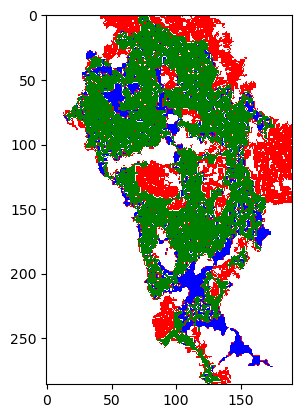

In [61]:
ndvi_grouped = calculate_p_den(0.1, params["low_thres"], params["high_thres"], ndvi)
for i in range(1000):
    fire_state = run_simulation(200, -1, -1, params['den_mid'], params['den_high'], ndvi_grouped, params['c_w'], params['c_s'], slope, wind_matrix, FP_lat_index, FP_lon_index)
    #final_state = run_simulation_final_state(200, params, ndvi_grouped, slope, wind_matrix,FP_lat_index,FP_lon_index)
    final_state = fire_state[-1,:,:]
    final_state = np.where(final_state==2,1,final_state).astype(np.int8)
    if get_f1_score(final_state, burnt_area)>0.746:
        break
new_mask = np.full(final_state.shape, 1)  # Initialize with -1 for undefined cases
print(i)
print(get_f1_score(final_state, burnt_area))
print(np.count_nonzero(final_state)/np.count_nonzero(burnt_area))
# Apply the conditions
new_mask[(final_state == 1) & (burnt_area == 1)] = 0 # predict fire, is fire
new_mask[(final_state == 0) & (burnt_area == 0)] = 1 # predict no fire, is no fire
new_mask[(final_state == 1) & (burnt_area == 0)] = 2 # predict fire, is no fire
new_mask[(final_state == 0) & (burnt_area == 1)] = 3 # predict no fire, is fire

mask_cmap = ListedColormap(['green', 'white', 'red', 'blue'])  # Define your colormap
#plt.imshow(new_mask, cmap=mask_cmap)

plt.savefig('img/bushfire/evaluation_result.png', dpi=300, bbox_inches='tight')
# White correct no fire
# Green correct fire
# Red no fire, but predicted fire

plt.imshow(new_mask, cmap=mask_cmap)
plt.show()


Let's save the the simulation for later together with the parameters

In [37]:
import pickle
animation_results ={}
animation_results['fire_state'] = fire_state
animation_results['params'] = params

with open('output/animation_results.pickle', 'wb') as handle:
    pickle.dump(animation_results, handle, protocol=pickle.HIGHEST_PROTOCOL)




## 1.5 Visualisation

In [60]:
fire_state_dict = pickle.load(open('output/animation_results.pickle', 'rb'))
fire_state = fire_state_dict['fire_state']

As we have varied the thresholds for what is dense and sparse vegetation, we need to generate the NDVI background map again.

In [38]:
ndvi_background = calculate_p_den(0.1, params["low_thres"], params["high_thres"], ndvi)
ndvi_background = calculate_p_den_values(-1, 0, 1, 2, ndvi_background)


Depending on the resolution, the fire front might be a bit hard to see in the animation because it is only 1 cell. We can improve the visualisation by creating a new fire state, where the fire is shown as fire for 1 or 2 time steps. The fire front is then 2 or 3 cells large.

We also turned all the flammable cells to NaNs. This allows us to plot the NDVI below the fire animation.

In [44]:
fire_state_doublefire = fire_state.copy()
fire_state_doublefire = np.where(fire_state == 0, np.nan, fire_state_doublefire)
for it in range(1,fire_state.shape[0]):
    fire_state_doublefire[it,:,:] = np.where(fire_state[it-1,:,:] == 1, 1, fire_state_doublefire[it,:,:])
for it in range(1,fire_state.shape[0]):
    fire_state_doublefire[it,:,:] = np.where(fire_state[it-1,:,:] == 1, 1, fire_state_doublefire[it,:,:])

We bring back the animation function, which really should have been turned into a function by now. And add some final touches and save it as a gif.

In [58]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from matplotlib.colors import ListedColormap
# Create a custom colormap for fire_state
fire_cmap = ListedColormap(['red', 'black'])  # Green for NDVI, Red for fire_state 1 and 2
ndvi_cmap = ListedColormap(['blue', 'goldenrod', 'limegreen', 'darkgreen'])  # Green for NDVI, blue for water, brownish for unflammable

fig, ax = plt.subplots()
ndvi_plot = ax.imshow(ndvi_background, cmap=ndvi_cmap)  # NDVI as the base layer
fire_plot = ax.imshow(fire_state_doublefire[0], cmap=fire_cmap, vmin=1, vmax=2)  # Fire state overlay
ax.text(40, 220, 'Wind Direction', color='black', fontsize=9, ha='center', va='center')
wind_plot = ax.quiver(40,250, wind_u[0], wind_v[0], scale=7, headlength=7)

def update(frame):
    fire_plot.set_array(fire_state_doublefire[frame])  # Update fire_state for the current frame
    wind_plot.set_UVC(wind_u[frame], wind_v[frame])  # Update wind vectors for the current frame
    ax.set_title(f"Time Step: {frame}")
    ax.axis('off')
    return [fire_plot, wind_plot]

fig.set_size_inches(4, 6)  # Adjust the figure size to your preference
plt.tight_layout()         # Minimizes white space

ani = FuncAnimation(fig, update, frames=range(0,fire_state_doublefire.shape[0]), interval=200, blit=True)
ani.save('./img/bushfire/fire_animation_final.gif', writer='pillow', fps=10)
plt.close(fig)  # Prevents duplicate static plot display

# Display the animation in Jupyter Notebook
HTML(ani.to_jshtml())


And now let's make the mask a bit nicer by including a legend that goes inside the plot.

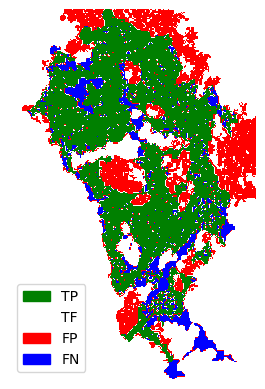

In [57]:
import matplotlib.patches as mpatches

new_mask = np.full(final_state.shape, 1)  # Initialize with -1 for undefined cases
new_mask[(final_state == 1) & (burnt_area == 1)] = 0 # predict fire, is fire
new_mask[(final_state == 0) & (burnt_area == 0)] = 1 # predict no fire, is no fire
new_mask[(final_state == 1) & (burnt_area == 0)] = 2 # predict fire, is no fire
new_mask[(final_state == 0) & (burnt_area == 1)] = 3 # predict no fire, is fire

mask_cmap = ListedColormap(['green', 'white', 'red', 'blue'])  # Define your colormap
colors = ['green', 'white', 'red', 'blue']
labels = ['TP', 'TF', 'FP', 'FN']
patches = [mpatches.Patch(color=c, label=l) for c, l in zip(colors, labels)]

#plt.imshow(new_mask, cmap=mask_cmap)

#plt.savefig('img/bushfire/evaluation_result.png', dpi=300, bbox_inches='tight')
# White correct no fire
# Green correct fire
# Red no fire, but predicted fire
fig, ax = plt.subplots()


#plt.legend(loc='lower left')

ax.imshow(new_mask, cmap=mask_cmap)
ax.legend(handles=patches, loc='lower left')
ax.axis('off')

plt.savefig('img/bushfire/evaluation_result.png', dpi=300, bbox_inches='tight')
plt.show()



## Summary - Final Thoughts

The results did not turn out too bad, especially, considering that there were actually multiple ignition points and we only used one. With the limited time that I gave myself to finish this project the results were really good, but there are a heaps of things to improve.

Looking at the actual fire scare and the NDVI map, the high NDVI regions did not burn much and worked as a fire stopper. However, there were some larger regions that should have burnt and others that should not have burnt. I think we could use additional information (NDWI for example) get more information. Also, the vegetation type, what kind of trees are dominant in a cell and how flammable they are could be an important part.

Another big problem is that the fire is spreading too fast. We have roughly 300 time steps from ignition until the fire ended in reality. In our simulation, the fire reached the end in only 200 time steps. That means that the wind might not match the evolution of the fire spread. I think in a more realistic setting, a cell should be burning over several time steps before it turns into a burnt cell. In this way, it would be possible for the spread fast in the direction of the wind, i.e., advancing in every time step. The overall probability of the fire to spread would be lower.

Overall, the time component was not handled well in this model. The fire is spreading too fast and stops too early. That also means that the wind data was not in sync with the current fire location. This part would need a lot more work.

Also information like rain, humidity and temperature should be added.

Once, we are really happy with the model (or probably a bit before) we can start applying the model to other fires. Does the model still produce an accurate prediction? Probably, we need to change the way we train the parameters. Instead of training it on the results of 1 firem the training should be on several fires. And then the average f1 score across multiple fires should be optimised. (Apply the classic ML train/test methodology)

If that works, then this model could be used to predict fires, even for live fires, if the wind, temperature and humidity can be predicted accurately. It could also be used to predict high fire areas.